# ReGRID model analysis
### for evaluating and visualizing energy system configurations

Note:
- This notebook depends on output files generated by the following notebooks:
  - model_DC.ipynb

In [11]:
import pandas as pd
from matplotlib import pyplot as plt
import networkx as nx
import os
import matplotlib.dates as mdates
import calendar
import matplotlib.dates as mdates
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [12]:
# Model definition

TERM = '1y'
STEP = 6
VER = 'v7'
YEAR = '2050'
BOUNDARY = 'japan'
PATHWAY = 'C1'
NUCLEAR_AVAILABILITY = 1
POTENTIAL_AVAILABILITY= 50
POTENTIAL_CASE = 'base'
COST_CASE = 'moderate'
DC_SCENARIO = 'NoDC' # 'Low','Mid','High','NoDC'
DC_STRATEGY = 'NoDC' # 'BAU','ILA','DEV'(=FLEX),'NoDC'

In [13]:
# Model name

model_name = f"ReGRID2_{VER}_{YEAR}_{PATHWAY}_{TERM}_{STEP}_{BOUNDARY}_n{NUCLEAR_AVAILABILITY}_p{POTENTIAL_AVAILABILITY}_{POTENTIAL_CASE}_{COST_CASE}_{DC_SCENARIO}_{DC_STRATEGY}"
print(model_name)

ReGRID2_v7_2050_C1_1y_6_japan_n1_p50_base_moderate_NoDC_NoDC


In [25]:
# Input data

# Region list
region_list = pd.read_csv('input/region.csv', index_col='code', dtype={'code':str, 'DSN':str})
REGION = region_list.index.to_list() # All nodes
SUBSTATION = pd.read_csv('input/region_substation.csv', index_col=0, dtype={'region':str})['region'].to_list() # Substation nodes
NODE = [r for r in REGION if r not in SUBSTATION] # Terminal nodes
AREA = region_list['DSN'].copy() # Distribution area
REGION06 = pd.Series(data=[f"{r:>6}".replace(' ','_') for r in REGION], index=REGION) # Region list (6 digit code)
SPREGION = {}
if BOUNDARY != 'japan':
    REGION = region_list[region_list['TSO'] == BOUNDARY].index.to_list() # All nodes
    SUBSTATION = [r for r in REGION if r in SUBSTATION] # Substation nodes
    NODE = [r for r in REGION if r not in SUBSTATION] # Terminal nodes
    AREA = region_list[region_list['TSO'] == BOUNDARY]['DSN'].copy() # Distribution area

# Time series list
TIME = pd.read_csv('input/%sh/time_%s.csv' % (STEP,TERM))['time'].to_list()
TIME04 = pd.Series(data=[f"{r:>4}".replace(' ','_') for r in TIME], index=TIME) # Time series (4 digit)
T_LEN = len(TIME)

# Time series scaling
if T_LEN * STEP == 8760:
    T_SCALE = 1
    T_EXPAND = 1
else:
    T_SCALE = (T_LEN * STEP) / 8760
    T_EXPAND = 8760 / (T_LEN * STEP)

# Technology list
RESOURCE = ['hydro','geoth','river','onwin','of-fx','of-fl','solar']
WASTE = ['waste','msw-c']
WOODY = ['woody','beccs']
THERMAL = ['coalp','coalc','gas-p','gas-c','oil-p']
STORAGE = ['stpmp','stbat']
H2TECH = ['st-h2','h2cmp','el-h2','h2-el']
DACCS = ['daccs']
if NUCLEAR_AVAILABILITY == 1:
    THERMAL += ['nuclr']

# Regional data aggregation
def city_to_substation(data):
    data = pd.concat([data, AREA], axis=1)
    ss_data = data.groupby(['DSN']).sum()
    return ss_data

# Storage parameter
storage_data = pd.read_csv('input/storage.csv', index_col='code', dtype={'code':str})
storage = city_to_substation(storage_data)

# Scenario data
scenario_data = pd.read_csv('input/scenarios.csv', index_col=0, dtype={'year':str})
scenario = scenario_data[scenario_data['category'] == PATHWAY] # Energy demand and emissions pathway

# CCS scenario
ccs_potential = pd.read_csv('input/ccs_potential.csv', index_col=['code'], dtype={'code':str})[YEAR]
SPREGION['ccs'] = [AREA[r] for r in ccs_potential[ccs_potential>0].index.to_list()] # CCS node list

# DAC scenario
# dac_scenario = scenario['Carbon Sequestration|Direct Air Capture'][YEAR] * 1000000 # MtCO2 -> tCO2

# CO2 emission
co2_cap = scenario['Emissions|CO2|Energy|Supply|Electricity'][YEAR] * 1000000 # MtCO2 -> tCO2

# Population scenario
population = pd.read_csv('input/population.csv', index_col='code', dtype={'code':str})
regional_population_growth = population[YEAR] / population['2020'] # Population growth rate
national_population_growth = sum(population[YEAR]) / sum(population['2020'])

# Electricity demand
regional_current_demand = pd.read_csv('input/%sh/elect.csv' % (STEP), index_col=0)
national_current_demand = regional_current_demand.sum().sum()
national_future_demand = scenario['Final Energy|Electricity'][YEAR] * 1000000 #TWh -> MWh
regional_future_demand = regional_current_demand * (regional_population_growth / national_population_growth) * (national_future_demand / national_current_demand)
regional_future_demand = regional_future_demand * (national_future_demand / regional_future_demand.sum().sum())
regional_future_demand = regional_future_demand.loc[:,REGION]

# Technology dataset (Cost, Efficiency, etc.)
P = pd.read_csv(f'input/technology/technology_{PATHWAY}.csv', index_col=0)
P = P[(P['year'] == int(YEAR)) & (P['scenario'] == COST_CASE)]

# Renewable energy temporal profiles
profile = {}
profile["solar"] = pd.read_csv('input/%sh/solar_2019.csv' % (STEP), index_col=0)
profile["onwin"] = pd.read_csv('input/%sh/onwind_2019.csv' % (STEP), index_col=0)
profile["of-fx"] = pd.read_csv('input/%sh/ofwind_2019_fixed.csv' % (STEP), index_col=0)
profile["of-fl"] = pd.read_csv('input/%sh/ofwind_2019_float.csv' % (STEP), index_col=0)
profile["river"] = pd.read_csv('input/%sh/river_2019.csv' % (STEP), index_col=0)
profile["geoth"] = pd.read_csv('input/%sh/geothermal_2019.csv' % (STEP), index_col=0)
profile["hydro"] = pd.read_csv('input/%sh/hydro_2019.csv' % (STEP), index_col=0)

# Annual capacity factor for renewables
CF_annual = pd.DataFrame(index=REGION)
for res in profile.keys():
    CF_annual[res] = (profile[res] / STEP).mean()

# Renewable energy potential (Megawatt-based)
potential_VRE_MW = pd.read_csv('input/potential/renewables_potential_MW_%s.csv' % POTENTIAL_CASE, index_col='code', dtype={'code':str})

potential_VRE = pd.DataFrame()
for res in CF_annual.columns:
    potential_VRE[res] = (potential_VRE_MW[res] * CF_annual[res] * 8760) # MW -> MWh
    if res != "hydro":
        potential_VRE[res] = potential_VRE[res] * POTENTIAL_AVAILABILITY / 100

# Renewable energy potential (Resource volume)
potential_BIOMASS_data = pd.read_csv('input/potential/renewables_potential_MWh_%s.csv' % POTENTIAL_CASE, index_col='code', dtype={'code':str})
potential_BIOMASS = city_to_substation(potential_BIOMASS_data)

# Region matrix
matrix = pd.read_csv('input/grid_matrix.csv', index_col='code', dtype={'code':str}) # Adjacency matrix
matrix = matrix.loc[REGION,REGION]
distance = pd.read_csv('input/grid_matrix_km.csv', index_col='code', dtype={'code':str})
grid_cap_exist = pd.read_csv(f'input/grid_matrix_MW.csv', index_col='code', dtype={'code':str})
if int(YEAR) > 2020:
    prev_result = f"ReGRID2_{VER}_{int(YEAR)-10}_{PATHWAY}_{TERM}_{STEP}_{BOUNDARY}_n{NUCLEAR_AVAILABILITY}_p{POTENTIAL_AVAILABILITY}_{POTENTIAL_CASE}_{COST_CASE}_{DC_SCENARIO}_{DC_STRATEGY}"
    if os.path.isfile(f'output/{prev_result}/grid_{int(YEAR)-10}.csv'):
        grid_cap_exist = pd.read_csv(f'output/{prev_result}/grid_{int(YEAR)-10}.csv', index_col='code', dtype={'code':str})

# Neighbor list
NEIGHBOR = {}
for r in REGION:
    NEIGHBOR[r] = matrix[r][matrix[r] == 1].index.to_list()
        
# Transmission parameter
#  Onshore AC
grid_loss = distance / 100 * 0.007 # 0.7% losses per 100km
grid_cost = distance * P['fixed_cost']['LVAC']
#  Onshore/offshore and HVAC/HVDC
HVDC = pd.read_csv('input/transmission_lines_HVDC.csv', index_col=['start_region', 'end_region'], dtype={'start_region':str, 'end_region':str})
HVAC = pd.read_csv('input/transmission_lines_HVAC.csv', index_col=['start_region', 'end_region'], dtype={'start_region':str, 'end_region':str})
for line in HVDC.index:
    grid_cost.loc[line[0],line[1]] = round(distance[line[0]][line[1]] * HVDC['cable_cost'][line] + HVDC['converter_cost'][line],2)
    grid_cost.loc[line[1],line[0]] = round(distance[line[1]][line[0]] * HVDC['cable_cost'][line] + HVDC['converter_cost'][line],2)
    grid_loss.loc[line[0],line[1]] = distance[line[0]][line[1]] / 100 * 0.003 + 0.01 # 0.3% losses per 100km for DC + 1% of conversion loss by VSC
    grid_loss.loc[line[1],line[0]] = distance[line[1]][line[0]] / 100 * 0.003 + 0.01
for line in HVAC.index:
    if line not in HVDC.index:
        grid_cost.loc[line[0],line[1]] = distance[line[0]][line[1]] * P['fixed_cost']['HVAC']
        grid_cost.loc[line[1],line[0]] = distance[line[1]][line[0]] * P['fixed_cost']['HVAC']

# H2 demand
h2_demand = pd.read_csv('input/h2_demand.csv', index_col=0, dtype={'code':str})
h2_demand['scenario'] = h2_demand['weight'] * scenario['Final Energy|Hydrogen'][YEAR] * 1000000 # TWh -> MWh
SPREGION['h2'] = h2_demand.index.to_list()
SPREGION['h2'] = [r for r in SPREGION['h2'] if r in SUBSTATION]
h2 = pd.DataFrame(index=TIME, columns=SPREGION['h2'])
for r in SPREGION['h2']:
    h2[r] = [round(h2_demand['scenario'][r] / T_LEN, 1) for t in TIME]

# Generation capacity
#  Esisting capacity (1960-2020)
capacity_data = pd.read_csv('input/power_plant.csv', dtype={'node':str})
#  Empty capacity
capacity_data_empty = pd.DataFrame(
    [[c1, c2, c3, 0] 
      for c1 in REGION
      for c2 in THERMAL+RESOURCE+WOODY+WASTE+STORAGE+H2TECH+DACCS
      for c3 in [1960,1970,1980,1990,2000,2010,2020,2030,2040,2050]],
    columns=['node', 'tech', 'year', 'MW'])
#  Calculated capacity from previous step
for year in [2020,2030,2040,2050]:
    if year < int(YEAR):
        prev_result = f"ReGRID2_{VER}_{year}_{PATHWAY}_{TERM}_{STEP}_{BOUNDARY}_n{NUCLEAR_AVAILABILITY}_p{POTENTIAL_AVAILABILITY}_{POTENTIAL_CASE}_{COST_CASE}_{DC_SCENARIO}_{DC_STRATEGY}"
        if os.path.isfile(f'output/{prev_result}/capacity_added_{year}.csv'):
            prev_result_capacity = pd.read_csv(f'output/{prev_result}/capacity_added_{year}.csv', dtype={'node':str})
            capacity_data = pd.concat([capacity_data, prev_result_capacity], axis=0)

#  Active capacity in target year
capacity_data = pd.concat([capacity_data, capacity_data_empty], axis=0).groupby(['node','tech','year']).sum()['MW'].reset_index()
capacity_data['expiration_year'] = capacity_data['year'] + capacity_data['tech'].map(P['lifetime']) # Final operation year
if int(YEAR) >= 2030:
    capacity_data['active_capacity'] = capacity_data.apply(lambda row: row['MW'] if (row['year'] <= int(YEAR)) & (row['expiration_year'] >= int(YEAR)) else 0, axis=1) # Exclude expired or planned facilities
else:
    capacity_data['active_capacity'] = capacity_data.apply(lambda row: row['MW'] if row['year'] <= int(YEAR) else 0, axis=1) # Utilize all existing facilities in 2020

#  Total active capacity
capacity_exist = capacity_data.groupby(['node', 'tech'])['active_capacity'].sum().unstack(fill_value=0)
capacity_total = capacity_data.groupby(['node', 'tech'])['MW'].sum().unstack(fill_value=0)

# Power plant node list
SPREGION['coalp'] = capacity_exist[(capacity_exist['coalp'] > 0) | (capacity_exist['coalc'] > 0)].index.to_list()
SPREGION['coalc'] = capacity_exist[(capacity_exist['coalp'] > 0) | (capacity_exist['coalc'] > 0)].index.to_list()
SPREGION['gas-p'] = capacity_exist[(capacity_exist['gas-p'] > 0) | (capacity_exist['gas-c'] > 0)].index.to_list()
SPREGION['gas-c'] = capacity_exist[(capacity_exist['gas-p'] > 0) | (capacity_exist['gas-c'] > 0)].index.to_list()
SPREGION['woody'] = capacity_exist[(capacity_exist['woody'] > 0) | (capacity_exist['beccs'] > 0)].index.to_list()
SPREGION['beccs'] = capacity_exist[(capacity_exist['woody'] > 0) | (capacity_exist['beccs'] > 0)].index.to_list()
SPREGION['oil-p'] = capacity_total[capacity_total['oil-p'] > 0].index.to_list() # Retrofitting available for isolated islands
SPREGION['nuclr'] = capacity_exist[capacity_exist['nuclr'] > 0].index.to_list()
SPREGION['waste'] = SUBSTATION
SPREGION['msw-c'] = SUBSTATION

# Power plant node dictionary
PLANT = {}
for r in SUBSTATION:
    PLANT[r] = [tech for tech in THERMAL+WOODY+WASTE if r in SPREGION[tech]]
for r in SPREGION['h2']:
    PLANT[r].append('h2-el')

In [ ]:
# Data for analysis

# Result
optimal = pd.read_csv('output/%s/%s.csv' % (model_name,model_name), index_col=0, dtype={'region':str, 'time':str})
optimal = optimal.replace('_', '', regex=True)
optimal = optimal.replace(' ', '', regex=True)

# # Coordinate
city_coord = pd.read_csv('input/analysis/position.csv', index_col=0, dtype={'code':str})

# Time series axis
if STEP == 6:
    TIME_axis = pd.date_range("2019/1/1 00:00" ,"2019/12/31 23:00" , freq="360min")
elif STEP == 3:
    TIME_axis = pd.date_range("2019/1/1 00:00" ,"2019/12/31 23:00" , freq="180min")
elif len(TIME) == 8760:
    TIME_axis = pd.date_range("2019/1/1 00:00" ,"2019/12/31 23:00" , freq="60min")
elif len(TIME) == 168:
    TIME_axis = pd.date_range("2019/1/1 00:00" ,"2019/2/11 23:00" , freq="360min")
else:
    TIME_axis = [t for t in range(len(TIME))]

# Technology list
BIOMASS = WASTE+WOODY
POWER_SOURCE = RESOURCE[::-1]+BIOMASS+THERMAL+['h2-el'] # All power sources

# DC load profile
dc_profile_100MW = pd.read_csv('input/%sh/datacenter_100MW.csv' % (STEP), index_col=0, dtype={0:int})
dc_profile = (dc_profile_100MW / 100).round(6)

# DC capacity
if os.path.isfile(f'output/{model_name}/datacenter_capacity_{int(YEAR)}.csv'):
    dc_capacity = pd.read_csv(f'output/{model_name}/datacenter_capacity_{int(YEAR)}.csv', index_col=0, dtype={'region':str})['value']
else:
    dc_capacity = pd.Series(index=REGION, data=0)

In [16]:
# Chart paramter
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.rm'] = 'Arial'
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.direction'] = 'out'
plt.rcParams['xtick.major.width'] = 0.5
plt.rcParams['ytick.major.width'] = 0.5
plt.rcParams['xtick.major.size'] = 2.5
plt.rcParams['ytick.major.size'] = 2.5
plt.rcParams['font.size'] = 7
plt.rcParams['xtick.labelsize'] = 7
plt.rcParams['ytick.labelsize'] = 7
plt.rcParams['axes.linewidth'] = 0.5

MAX_WIDTH = 180 / 25.4 # inch in 180mm

In [34]:
# Grid map

# Data
grid = optimal[optimal.id == 'grd'].groupby(['region','general'], as_index=True).sum()['value']
export = optimal[optimal.id == 'exp'].groupby(['region','general'], as_index=True).sum()['value']


#####################################
#   Base map and Parameters
#####################################

# Setup grid map
plt.figure(figsize=(MAX_WIDTH*0.5*1.3, MAX_WIDTH*0.5), dpi=3000)
ax = plt.axes(projection=ccrs.PlateCarree())

# Geographical coverage [W,E,S,N]
area_coord = [126.6, 147.0, 25.6, 45.9]
map_width = area_coord[1]-area_coord[0]
map_height = area_coord[3]-area_coord[2]

# Municipal boundary
municipal_shapes = list(shpreader.Reader("input/analysis/shp/1741municipalities/1741municipalities.shp").geometries())
ax.add_geometries(municipal_shapes, ccrs.PlateCarree(), edgecolor=(0.8,0.8,0.8,1), facecolor=(1,1,1,0), linewidth = 0.03, zorder=1)

# National boundary
japan_shapes = list(shpreader.Reader("input/analysis/shp/Japan/Japan.shp").geometries())
ax.add_geometries(japan_shapes, ccrs.PlateCarree(), edgecolor=(0.1,0.1,0.1,1), facecolor=(0,0,0,0), linewidth = 0.1, zorder=2)

# Create position dictionary
pos_dict = {city: [city_coord['long'][city], city_coord['lat'][city]] for city in city_coord.index}

# Size adjustment parameters
flow_adjust = 0.002 # Adjust width of power flow
line_adjust = flow_adjust / 50 # Adjust width line capacity
node_adjust = 0.03 # Adjust Pi chart size
node_pie_adjust = 0.3 # Adjust networkx nodes
legend_node_size = 5 # Adjust legend circle size
title_size = 5 # Annotation title font size
annot_size = 5 # Annotation font size

# # Size adjustment parameters
# flow_adjust = 0.015 # Adjust width of power flow
# line_adjust = flow_adjust / 50 # Adjust width line capacity
# node_adjust = 0.03 # Adjust Pi chart size
# node_pie_adjust = 9 # Adjust networkx nodes
# legend_node_size = 100 # Adjust legend circle size
# title_size = 6 # Annotation title font size
# annot_size = 6 # Annotation font size

# color
flow_color = '#FA8000'
line_color = '#555'
pie_color = '#555'


#####################################
#   Transmission capacity network
#####################################

Grid = nx.DiGraph()
Grid.add_nodes_from(REGION)
Grid.add_edges_from(grid.index)
grid_capacity = (grid.loc[list(Grid.edges())] * line_adjust).to_list()
nx.draw_networkx(Grid, pos=pos_dict, with_labels=False, arrowstyle ='-', node_size=0, width=grid_capacity, edge_color=line_color)


#####################################
#   Power flow network
#####################################

# Node size from annual generation
cap_region = optimal[optimal.id == 'cap'].groupby(['region','general']).sum()
gen_region = optimal[optimal.id == 'gen'].groupby(['region','general']).sum()
city_scale = [(sum([(cap_region.loc[(city,res)].value * profile[res][city].sum()) for res in RESOURCE]) 
            + sum([gen_region.loc[(city,f)].value for f in WASTE if city in SUBSTATION] 
            + [(gen_region.loc[(city,f)].value if ((city,f) in gen_region.index) else 0) for f in WOODY+THERMAL] 
            + [gen_region.loc[(city,'h2-el')].value if city in SPREGION['h2'] else 0]))/1000000*node_pie_adjust for city in REGION]

Flow = nx.DiGraph()
Flow.add_nodes_from(REGION)
Flow.add_edges_from(export.index)
power_flow = ((export.loc[list(Flow.edges())] / 1000)**0.5 * flow_adjust).to_list() #MWh->GWh
power_flow_arrow = [(5 if f > 1 else 3 if f > 0.3 else 0.5) for f in power_flow] # Size of arrow head
nx.draw_networkx(Flow, pos=pos_dict, with_labels=False, arrowstyle ='->', arrowsize=power_flow_arrow, connectionstyle='arc3,rad=0.2', node_size=city_scale, node_color=[(0.0,0.0,0.0,0.0)], width=power_flow, edge_color=flow_color)


#############################
#   Generation (pie charts)
#############################

# Discarding islands out of boundary
discard = ['472077','473758','473821','472140','473812'] #石垣市,多良間村,与那国町,宮古島市,竹富町

# Draw pie charts
for city in sorted(REGION):
    if city in discard:
        continue
    else:
        if city in SUBSTATION:
            pie_mix = [max(round(cap_region.loc[(city,res)].value * profile[res][city].sum()), 0.1) for res in RESOURCE[::-1]] + [(max(round(gen_region.loc[(city,f)].value), 0.1) if ((city,f) in gen_region.index) else 0.1) for f in BIOMASS+THERMAL] + [max(gen_region.loc[(city,'h2-el')].value, 0.1) if city in SPREGION['h2'] else 0]
            pie_color = [P['color'][res] for res in POWER_SOURCE]
        else:
            pie_mix = [max(round(cap_region.loc[(city,res)].value * profile[res][city].sum()), 0.1) for res in RESOURCE]
            pie_color = [P['color'][res] for res in RESOURCE]
        pie_size = (sum(pie_mix)/1000000)**0.5*node_adjust
        pie_chart, pie_t = ax.pie(pie_mix, center=(city_coord['long'][city],city_coord['lat'][city]), colors=pie_color, radius=pie_size)
        [p.set_zorder(10) for p in pie_chart]


#####################################
#   Legend
#####################################

# Legend values
flow = [50,10] #TWh/year
line = [10,5] #GW
gen = [50,10] #TWh

n_legend_nodes = len(flow)*2 + len(line)*2
legend_flow = [(f * 1000) ** 0.5 * flow_adjust for f in flow]
legend_line = [l * 1000 * line_adjust for l in line]
legend_color = ['#fff']*n_legend_nodes + [P['color'][res] for res in POWER_SOURCE]
legend_size = [0]*n_legend_nodes + [legend_node_size for res in POWER_SOURCE]
legend_width = legend_line + legend_flow
legend_edge_color = [flow_color for i in flow] + [line_color for i in line]
legend_x = area_coord[0] + map_width * 0.12
legend_y = area_coord[2] + map_height * 0.93
legend_interval = map_height*0.04*-1
legend_length = map_width * 0.05
annot_margin = legend_length*0.2
pos_dict_legend= {}


# Scale legend (top-left)
def edge_annotate(title, x, y, s, p0, p1):
    ax.annotate(title, xy=(x+annot_margin, y), size=s, verticalalignment='center')
    pos_dict_legend.setdefault(p0,[x-legend_length, y]) #Left point
    pos_dict_legend.setdefault(p1,[x, y]) #Right point

def pie_annotate(title, x, y, s, rad):
    ax.annotate(title, xy=(x+annot_margin, y), size=s, verticalalignment='center')
    ax.pie([1], center=(x-legend_length/2, y), colors=["#333"], radius=rad**0.5*node_adjust)

ax.annotate("Transmission capacity", xy=(legend_x-legend_length,legend_y), size=title_size, verticalalignment='center', fontweight='bold')
legend_y = legend_y + legend_interval
edge_annotate(f"{line[0]} GW", legend_x, legend_y, annot_size, 30, 31)
legend_y = legend_y + legend_interval
edge_annotate(f"{line[1]} GW", legend_x, legend_y, annot_size, 40, 41)
legend_y = legend_y + legend_interval*1.2

ax.annotate("Transmission volume", xy=(legend_x-legend_length,legend_y), size=title_size, verticalalignment='center', fontweight='bold')
legend_y = legend_y + legend_interval
edge_annotate(f"{flow[0]}"+r" TWh yr$^{-1}$", legend_x, legend_y, annot_size, 10, 11)
legend_y = legend_y + legend_interval
edge_annotate(f"{flow[1]}"+r" TWh yr$^{-1}$", legend_x, legend_y, annot_size, 20, 21)
legend_y = legend_y + legend_interval*1.2

ax.annotate("Electricity generation", xy=(legend_x-legend_length,legend_y), size=title_size, verticalalignment='center', fontweight='bold')
legend_y = legend_y + legend_interval
pie_annotate(f"{gen[0]}"+r" TWh yr$^{-1}$", legend_x, legend_y, annot_size, gen[0])
legend_y = legend_y + legend_interval
pie_annotate(f"{gen[1]}"+r" TWh yr$^{-1}$", legend_x, legend_y, annot_size, gen[1])
legend_y = legend_y + legend_interval


# Color legend (bottom-right)
# legend_x = area_coord[0] + map_width * 0.85
legend_x = area_coord[0] + map_width * 1.1
legend_y = area_coord[2] + map_height * 0.62
legend_interval = legend_interval*0.85
for n,res in enumerate(POWER_SOURCE):
    ax.annotate(P['name'][res], xy=(legend_x+annot_margin*1.5, legend_y+legend_interval*n*1.003), size=annot_size, verticalalignment='center')
    pos_dict_legend.setdefault(res,[legend_x-legend_length/3, legend_y+legend_interval*n])


# Draw legend
G_legend = nx.DiGraph()
G_legend.add_nodes_from([10, 11, 20, 21, 30, 31, 40, 41]+POWER_SOURCE)
G_legend.add_edges_from([(10, 11), (20, 21), (30, 31), (40, 41)]) # flow[0], flow[1], line[0], line[1]
nx.draw_networkx(G_legend, pos=pos_dict_legend, with_labels=False, arrowstyle ='-', node_size=legend_size, node_color = legend_color, width=legend_width, edge_color = legend_edge_color)


#############################
#   Output
#############################

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.1, color='gray', alpha=0.6, linestyle='--')
gl.top_labels = True
gl.right_labels = False
gl.bottom_labels = False
gl.left_labels = True
gl.xlabel_style = {'fontsize': 5, 'color': "gray"}
gl.ylabel_style = {'fontsize': 5, 'color': "gray"}
gl.xformatter = LONGITUDE_FORMATTER #°Eを付与
gl.yformatter = LATITUDE_FORMATTER #°Nを付与
gl.xpadding = 1
gl.ypadding = 1

# Draw
ax.set_extent(area_coord, crs=ccrs.PlateCarree())
plt.axis('off')
# plt.savefig(f"output/{model_name}/map_{model_name}_{BOUNDARY}.jpg", bbox_inches='tight', pad_inches=0, transparent=False, dpi=3000)
plt.savefig(f"output/{model_name}/map_{model_name}_{BOUNDARY}.eps", bbox_inches='tight', pad_inches=0, dpi=300)
plt.show()
plt.clf()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 640x480 with 0 Axes>

In [18]:
# System configuration

def technology_stack_plot(data, label, title, legend_col):

    ax = data.plot(kind="bar", stacked=True, figsize=(MAX_WIDTH*0.5, MAX_WIDTH*0.5), color=[P['color'][abr] for abr in data.columns.to_list()])
    ax.tick_params(bottom=False, labelbottom=False)
    handles, labels = ax.get_legend_handles_labels() 

    ax.axhline(0, color='black', linewidth=1.0)
    plt.legend(handles[::-1], [P['name'][abr] for abr in data.columns.to_list()][::-1], bbox_to_anchor=(1.05, 1.02), labelspacing=0.18, loc='upper left', frameon = False, ncol=legend_col)
    plt.ylabel(label)

    # plt.savefig(title, bbox_inches='tight', dpi=300)
    plt.show()

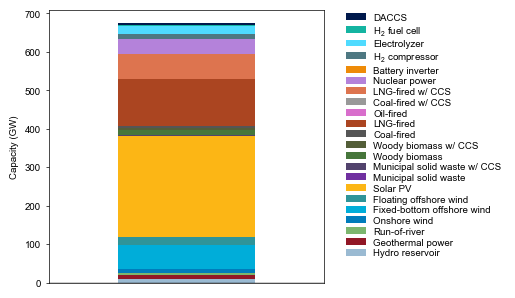

In [19]:
# Capacity

capacity_tech = optimal[optimal.id == 'cap'].groupby('general').sum()['value'] / 1000 # MW -> GW
df_capacity = pd.DataFrame(capacity_tech, columns=['value']).T
if int(YEAR) > 2020:
    df_capacity = df_capacity.loc[:,RESOURCE + BIOMASS + THERMAL + ['stpcs'] + ['h2cmp','el-h2','h2-el'] + ['daccs']]
else:
    df_capacity = df_capacity.loc[:,RESOURCE + BIOMASS + THERMAL + ['stpcs'] + ['h2cmp','el-h2','h2-el']]

technology_stack_plot(df_capacity, "Capacity (GW)", f'output/{model_name}/capacity_{model_name}.jpg', legend_col=1)


# Export
capacity_region = optimal[optimal.id == 'cap'].groupby(['region','general']).sum()['value'].reset_index()
capacity_region['year'] = YEAR
capacity_region.to_csv('output/%s/capacity_region_%s.csv' % (model_name,model_name), index=False)
capacity_total = capacity_region.groupby(['general'])['value'].sum()
capacity_total.to_csv('output/%s/capacity_%s.csv' % (model_name,model_name), header=['GW'])

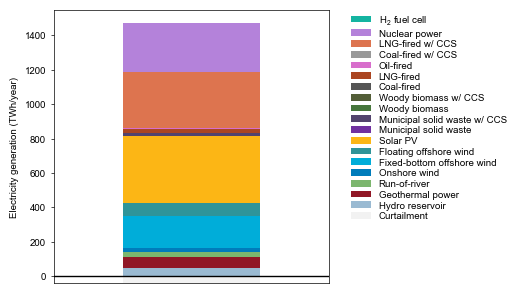

In [20]:
# Power mix
power_mix_dict = {}

cap_region = optimal[optimal.id == 'cap'].groupby(['region','general']).sum()
gen_region = optimal[optimal.id == 'gen'].groupby(['region','general']).sum()
crt_region = optimal[optimal.id == 'crt'].groupby('region').sum()['value']

for city in sorted(REGION):
    if city in SUBSTATION:
        local_power_mix = [max(round(cap_region.loc[(city,res)].value * profile[res][city].sum()), 0) for res in RESOURCE] + [(max(round(gen_region.loc[(city,f)].value), 0) if ((city,f) in gen_region.index) else 0) for f in BIOMASS+THERMAL] + [max(gen_region.loc[(city,'h2-el')].value, 0) if city in SPREGION['h2'] else 0]
    else:
        local_power_mix = [max(round(cap_region.loc[(city,res)].value * profile[res][city].sum()), 0) for res in RESOURCE] + [0 for n in BIOMASS + THERMAL + ['h2-el']]

    local_power_mix.insert(0,-crt_region[city])
    power_mix_dict[city] = local_power_mix

power_mix = pd.DataFrame(data=power_mix_dict, index=['crt']+RESOURCE+BIOMASS+THERMAL+['h2-el']).T.loc[REGION]
power_mix_total = power_mix.sum() / 1000000 # MWh -> TWh
df_power_mix = pd.DataFrame(power_mix_total, columns=['value']).T
technology_stack_plot(df_power_mix, "Electricity generation (TWh/year)", f'output/{model_name}/generation_{model_name}.jpg', legend_col=1)


# Export
power_mix.to_csv('output/%s/generation_region_%s.csv' % (model_name,model_name))
power_mix.sum().to_csv('output/%s/generation_%s.csv' % (model_name,model_name), header=['MWh'])

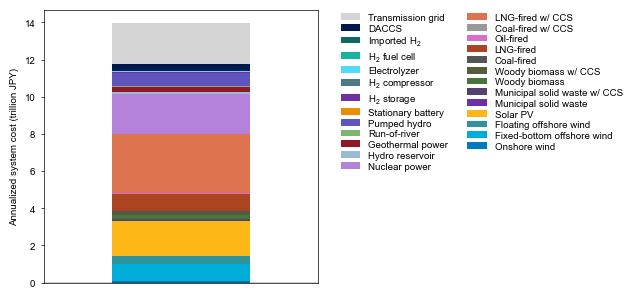

13.987884380312035 trillion JPY
10.32104687423201 JPY/kWh


In [21]:
# System costs
system_cost = pd.Series()

# Fixed cost
cap = optimal[optimal.id == 'cap'][['general','value']].groupby(['general'], as_index=['general']).sum()
system_cost = cap['value'] * P['fixed_cost']
system_cost['stbat'] += system_cost['stpcs']
system_cost = system_cost.loc[RESOURCE + BIOMASS + THERMAL + STORAGE + H2TECH + ['daccs']]

# Grid cost
cost_grid = optimal[(optimal.id == 'grd') & (optimal.value > 0)]
cost_grid.loc[:, 'region'] = cost_grid['region'].astype(str)
cost_grid = cost_grid.set_index(['region','general'])['value'] 
for pair in cost_grid.index:
    cost_grid[pair] = cost_grid[pair] * grid_cost[pair[0]][pair[1]]

# Variable cost
cost_fuel = optimal[optimal.id == 'gen'].groupby(['general'], as_index=['general'])['value'].sum()
for tech in BIOMASS + THERMAL:
    system_cost[tech] += cost_fuel[tech] * P['variable_cost'][tech] * T_EXPAND

# DACCS
cost_dac = optimal[optimal.id == 'dac']['value'].sum() * P['variable_cost']['daccs']
system_cost['daccs'] += cost_dac * T_EXPAND

# Fuel import cost
cost_ih2 = optimal[optimal.id == 'ih2']['value'].sum() * P['variable_cost']['ih2-f']
system_cost['ih2-f'] = cost_ih2 * T_EXPAND


# Small cost
small_cost = 0.00001 # 0.01 JPY/kWh

# charging
cost_chg = optimal[(optimal.id == 'chg') & (optimal.value > 0)].groupby('general').sum()['value']
cost_dcg = optimal[(optimal.id == 'dcg') & (optimal.value > 0)].groupby('general').sum()['value']
for st in STORAGE:
    try:
        system_cost[st] += (cost_chg[st] + cost_dcg[st]) * small_cost * T_EXPAND
    except:
        system_cost[st] = 0

# export
cost_exp = optimal[(optimal.id == 'exp') & (optimal.value > 0)].groupby(['region','general'], as_index=False)['value'].sum()
cost_exp['region'] = cost_exp['region'].astype(str)
cost_exp['general'] = cost_exp['general'].astype(str)
cost_exp = cost_exp.set_index(['region','general'])['value'] * small_cost * T_EXPAND

# import
cost_imp = optimal[(optimal.id == 'imp') & (optimal.value > 0)].groupby(['region','general'], as_index=False)['value'].sum()
cost_imp['region'] = cost_imp['region'].astype(str)
cost_imp['general'] = cost_imp['general'].astype(str)
cost_imp = cost_imp.set_index(['region','general'])['value'] * small_cost * T_EXPAND
system_cost['grid'] = cost_grid.sum() + cost_exp.sum() + cost_imp.sum()

# hydrogen
system_cost['st-h2'] += (optimal[optimal.id == 'hcg']['value'].sum() + optimal[optimal.id == 'hdg']['value'].sum()) * small_cost * T_EXPAND
system_cost['el-h2'] += optimal[optimal.id == 'prd']['value'].sum() * small_cost * T_EXPAND


# Sort index
system_cost = system_cost.reindex(['onwin','of-fx','of-fl','solar'] + BIOMASS + THERMAL + ['hydro','geoth','river'] + STORAGE + H2TECH + ['ih2-f','daccs'] + ['grid'])
tech_list = system_cost.index.to_list()

# Draw
system_cost = system_cost / 1000000 # million -> trillion
df_system_cost = system_cost.to_frame(model_name).T
technology_stack_plot(df_system_cost, "Annualized system cost (trillion JPY)", f'output/{model_name}/cost_{model_name}.jpg', legend_col=2)

# Export
DC_demand_TWh = {"High":{'2020':19, '2030':36, '2040':105, '2050':211},
                "Mid":{'2020':19, '2030':36, '2040':65, '2050':107},
                "Low":{'2020':19, '2030':36, '2040':40, '2050':43},
                "NoDC":{'2020':0, '2030':0, '2040':0, '2050':0}}

total_cost = system_cost.sum().sum()
total_demand = regional_future_demand.sum().sum() + h2.sum().sum() + DC_demand_TWh[DC_SCENARIO][YEAR]*1000000
unit_cost = total_cost/total_demand*1000000000 # trillion JPY/MWh -> JPY/kWh
cost_summary = pd.Series(index=['system_cost','unit_cost'], data=[total_cost, unit_cost])
cost_summary.to_csv('output/%s/cost_total_%s.csv' % (model_name,model_name))
system_cost.to_csv('output/%s/cost_%s.csv' % (model_name,model_name), header=['trillion_JPY'])

print(total_cost, 'trillion JPY')
print(unit_cost, 'JPY/kWh')

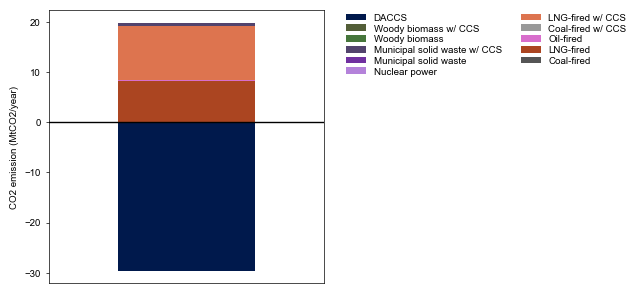

In [22]:
# CO2 emission

emission = df_power_mix.T['value'].loc[THERMAL+BIOMASS].copy()

for fuel in THERMAL+BIOMASS:
    if fuel == 'beccs':
        emission['beccs'] = -1*emission['beccs'] / P['ef']['beccs'] * P['cdr']['beccs']
    else:
        emission[fuel] = emission[fuel] / P['ef'][fuel] * P['cef'][fuel]

emission['daccs'] = -1*optimal[optimal.id == 'dac']['value'].sum() * P['cdr']['daccs']/1000000

df_emission = emission.to_frame(model_name).T
technology_stack_plot(df_emission, "CO2 emission (MtCO2/year)", f'output/{model_name}/emission_{model_name}.jpg', legend_col=2)

# Export
emission.to_csv('output/%s/emission_%s.csv' % (model_name,model_name), header=['MtCO2'])

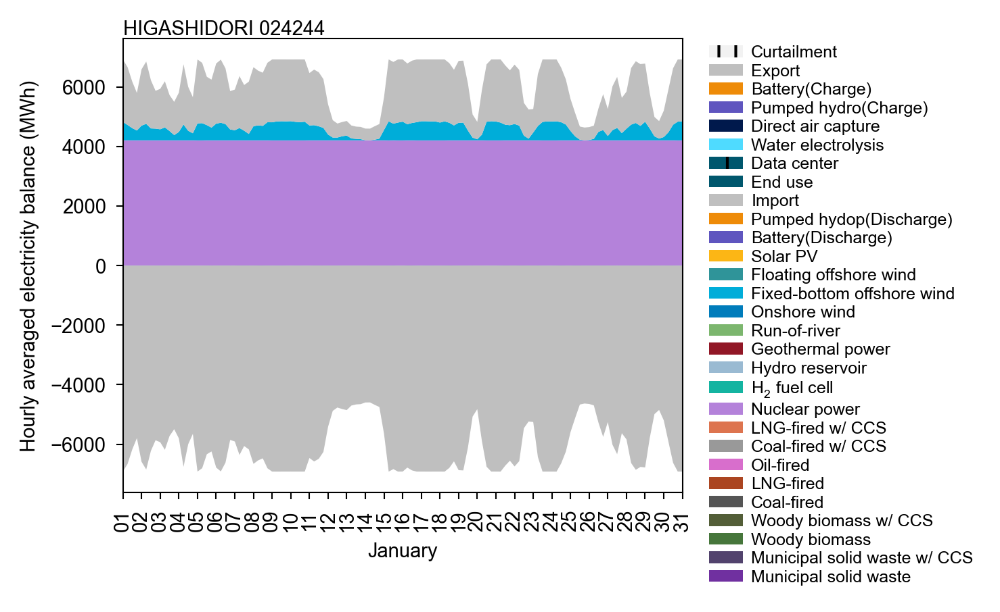

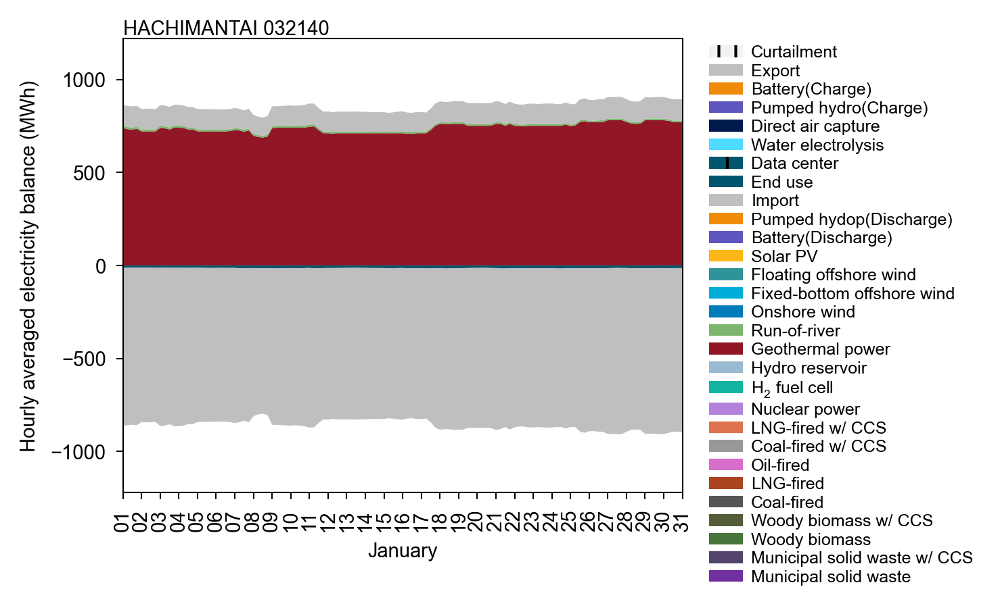

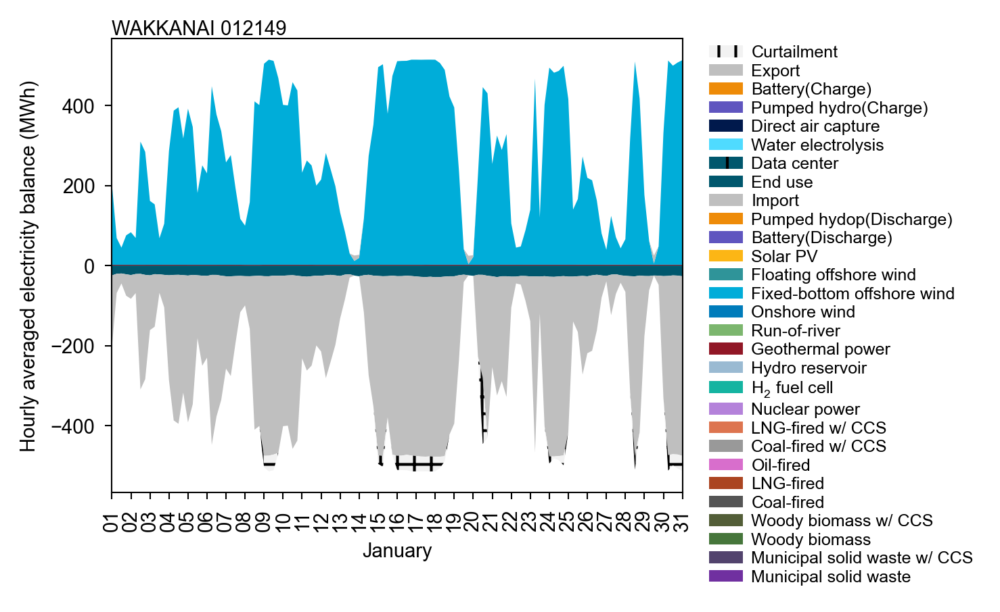

In [23]:
# Hourly electcity balance

supply = {}
demand = {}

def hourly_stack_plot(city, chart_month):
    # Generation (VRE)
    cap = optimal[(optimal.id == 'cap') & (optimal.region == city)].groupby(['general']).sum()
    gen = {}
    for res in RESOURCE:
        gen[res] = (profile[res][str(city)][profile[res].index.isin(TIME)] * cap.loc[res].value).to_list()
        
    # Generation (Dispatchable)
    gen_fuel = {}
    for fuel in BIOMASS + THERMAL + ['h2-el']:
        gen_fuel[fuel] = optimal[(optimal.id == 'gen') & (optimal.region == city) & (optimal.general == fuel)].groupby(['general','time']).sum().value.to_list()

    # Production (PtG)
    ele_h2 = (optimal[(optimal.id == 'prd') & (optimal.region == city)].groupby(['general','time'])['value'].sum()*-1/P['ef']['el-h2']).to_list()

    # DACCS
    ele_dac = (optimal[(optimal.id == 'dac') & (optimal.region == city)].groupby(['general','time'])['value'].sum()*-1).to_list()

    # Charge/Discharge
    dcg = {}
    chg = {}
    for st in STORAGE:
        dcg[st] = optimal[(optimal.id == 'dcg') & (optimal.region == city) & (optimal.general == st)].groupby(['time']).sum().value.to_list()
        chg[st] = (optimal[(optimal.id == 'chg') & (optimal.region == city) & (optimal.general == st)].groupby(['time']).sum()*-1).value.to_list()

    # Import/Export
    imp = optimal[(optimal.id == 'imp') & (optimal.region == city)].groupby(['time']).sum().value.to_list()
    exp = (optimal[(optimal.id == 'exp') & (optimal.region == city)].groupby(['time']).sum()*-1).value.to_list()

    # Curtailment
    crt = (optimal[(optimal.id == 'crt') & (optimal.region == city)].groupby(['time']).sum()*-1).value.to_list()

    # Data center demand
    dc = ((dc_profile*dc_capacity.T)[city]*-1).to_list()

    # Demand
    dmd = (regional_future_demand[str(city)][regional_future_demand.index.isin(TIME)] * -1).tolist()


    # Supply data
    supply[city] = [gen_fuel[fuel] for fuel in BIOMASS + THERMAL + ['h2-el']] + [gen[res] for res in RESOURCE] + [dcg[st] for st in STORAGE] + [imp]
    for s_stack in range(len(supply[city])):
        supply[city][s_stack] = [x / STEP for x in supply[city][s_stack]]
        if supply[city][s_stack] == []:
            supply[city][s_stack] = [0 for t in TIME]

    # Demand data
    demand[city] = [dmd, dc, ele_h2, ele_dac] + [chg[st] for st in STORAGE] + [exp, crt]
    for d_stack in range(len(demand[city])):
        demand[city][d_stack] = [x / STEP for x in demand[city][d_stack]]
        if demand[city][d_stack] == []:
            demand[city][d_stack] = [0 for t in TIME]

    # Draw
    fig = plt.figure(figsize=(MAX_WIDTH*0.7,MAX_WIDTH*0.7*0.6), dpi=300, facecolor="white")
    
    ax1 = fig.add_subplot(1, 1, 1, xmargin=0)
    stack_pos = ax1.stackplot(TIME_axis, supply[city], labels=([P['name'][abr] for abr in BIOMASS + THERMAL + ['h2-el'] + RESOURCE] + ['Battery(Discharge)','Pumped hydop(Discharge)','Import']), colors=([P['color'][abr] for abr in BIOMASS + THERMAL + ['h2-el'] + RESOURCE + STORAGE + ['import']]))
    stack_neg = ax1.stackplot(TIME_axis, demand[city], labels=(['End use', 'Data center','Water electrolysis', 'Direct air capture', 'Pumped hydro(Charge)', 'Battery(Charge)', 'Export', 'Curtailment']), colors=([P['color'][abr] for abr in ['demand','demand','el-h2', 'daccs','stpmp','stbat','export','crt']]))
    plt.ylabel("Hourly averaged electricity balance (MWh)")
    ax1.set_title(region_list.loc[str(city)].city_en + " " + str(city).zfill(6), size=7, loc='left', pad=0)

    hatches=['','+','','','','','','++']
    for stack, hatch in zip(stack_neg, hatches):
        stack.set_hatch(hatch)

    if 1 <= chart_month <= 12:
        x_start = pd.Timestamp(year=TIME_axis.min().year, month=chart_month, day=1)
        x_end = pd.Timestamp(year=TIME_axis.min().year, month=chart_month, day=calendar.monthrange(2050,chart_month)[1])
        plt.xlim([x_start, x_end])
        MONTH = calendar.month_name[chart_month]
        plt.xlabel(calendar.month_name[chart_month])
        ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d'))
        ax1.xaxis.set_major_locator(mdates.DayLocator())   
    elif (STEP > 0) or (len(TIME) == 8760):
        ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
        ax1.xaxis.set_major_locator(mdates.MonthLocator())
        MONTH = 'annual'

    ax1.tick_params(axis='x', labelsize=7)
    ax1.tick_params(axis='y', labelsize=7)
    plt.xticks(rotation=90)

    handles, labels = ax1.get_legend_handles_labels()
    ax1.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.02, 1.02), loc='upper left', frameon = False, fontsize=6, ncol=1, handletextpad=0.5, labelspacing=0.18)
    
    plt.tight_layout()
    fig.savefig("output/%s/balance_%s_%s.jpg" % (model_name,city,MONTH), dpi=300)
    plt.show()

    # Export CSV
    pd_supply = pd.DataFrame(data=supply[city],index=[P['name'][abr] for abr in BIOMASS + THERMAL + ['h2-el'] + RESOURCE] + ['Battery(Discharge)','Pumped hydop(Discharge)','Import'])
    pd_demand = pd.DataFrame(data=demand[city],index=['End use', 'Data center','Water electrolysis', 'Direct air capture', 'Pumped hydro(Charge)', 'Battery(Charge)', 'Export', 'Curtailment'])
    pd_balance = pd.concat([pd_supply,pd_demand], axis=0)
    pd_balance.T.to_csv("output/%s/balance_%s_%s.csv" % (model_name,city,MONTH))


optimal.time = pd.to_numeric(optimal.time, errors='coerce')

CITIES = ['24244','32140','12149']
for city in CITIES:
    hourly_stack_plot(city, 1) #1: January